# Restaurant Revenue Prediction

## 1. Data Preprocessing

In [1]:
# import the used defined package for reading the different files
from DataLoader import DataLoader
import warnings
warnings.filterwarnings("ignore")

In [2]:
# read the data
path = "restaurant_data.csv"
dl = DataLoader(path)
restaurant_revenue_data = dl.read_data()

In [3]:
# print the data
restaurant_revenue_data.head()

,Name,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations,Revenue
0,Restaurant 0,Rural,Japanese,4.0,38,73.98,2224,23406,13,185,161.924906,1.3,7.0,Yes,13,4,638945.52
1,Restaurant 1,Downtown,Mexican,3.2,76,28.11,4416,42741,8,533,148.759717,2.6,3.4,Yes,48,6,490207.83
2,Restaurant 2,Rural,Italian,4.7,48,48.29,2796,37285,18,853,56.849189,5.3,6.7,No,27,14,541368.62
3,Restaurant 3,Rural,Italian,4.4,34,51.55,1167,15214,13,82,205.433265,4.6,2.8,Yes,9,17,404556.80
4,Restaurant 4,Downtown,Japanese,4.9,88,75.98,3639,40171,9,78,241.681584,8.6,2.1,No,37,26,1491046.35


In [4]:
# shape of the data
restaurant_revenue_data.shape

(8368, 17)

In [5]:
# columns in the data
restaurant_revenue_data.columns

Index(['Name', 'Location', 'Cuisine', 'Rating', 'Seating Capacity',
       'Average Meal Price', 'Marketing Budget', 'Social Media Followers',
       'Chef Experience Years', 'Number of Reviews', 'Avg Review Length',
       'Ambience Score', 'Service Quality Score', 'Parking Availability',
       'Weekend Reservations', 'Weekday Reservations', 'Revenue'],
      dtype='object')

In [6]:
# info of the data
restaurant_revenue_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8368 entries, 0 to 8367
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Name                    8368 non-null   object 
 1   Location                8368 non-null   object 
 2   Cuisine                 8368 non-null   object 
 3   Rating                  8368 non-null   float64
 4   Seating Capacity        8368 non-null   int64  
 5   Average Meal Price      8368 non-null   float64
 6   Marketing Budget        8368 non-null   int64  
 7   Social Media Followers  8368 non-null   int64  
 8   Chef Experience Years   8368 non-null   int64  
 9   Number of Reviews       8368 non-null   int64  
 10  Avg Review Length       8368 non-null   float64
 11  Ambience Score          8368 non-null   float64
 12  Service Quality Score   8368 non-null   float64
 13  Parking Availability    8368 non-null   object 
 14  Weekend Reservations    8368 non-null   

In [7]:
# checking for null values in the data
restaurant_revenue_data.isna().sum()

Name                      0
Location                  0
Cuisine                   0
Rating                    0
Seating Capacity          0
Average Meal Price        0
Marketing Budget          0
Social Media Followers    0
Chef Experience Years     0
Number of Reviews         0
Avg Review Length         0
Ambience Score            0
Service Quality Score     0
Parking Availability      0
Weekend Reservations      0
Weekday Reservations      0
Revenue                   0
dtype: int64

In [8]:
# checking for any noisy values in the data
for i in restaurant_revenue_data.columns:
    print(i)
    print(restaurant_revenue_data[i].unique())
    print("\n")

Name
['Restaurant 0' 'Restaurant 1' 'Restaurant 2' ... 'Restaurant 8365'
 'Restaurant 8366' 'Restaurant 8367']


Location
['Rural' 'Downtown' 'Suburban']


Cuisine
['Japanese' 'Mexican' 'Italian' 'Indian' 'French' 'American']


Rating
[4.  3.2 4.7 4.4 4.9 4.1 4.2 5.  4.3 3.1 4.8 4.6 3.6 3.3 3.4 3.5 3.7 3.8
 4.5 3.  3.9]


Seating Capacity
[38 76 48 34 88 79 49 61 37 32 40 77 42 59 87 56 60 72 53 57 75 82 41 35
 68 64 31 46 45 74 71 84 33 51 54 67 70 89 55 83 39 47 58 81 63 80 69 78
 43 85 50 90 52 44 36 30 65 86 73 62 66]


Average Meal Price
[73.98 28.11 48.29 ... 72.06 53.63 71.07]


Marketing Budget
[2224 4416 2796 ... 5150  915 5949]


Social Media Followers
[23406 42741 37285 ... 63945  7170 24268]


Chef Experience Years
[13  8 18  9  5 11 14 16  4 19  2 17  6 15  1  3  7 10 12]


Number of Reviews
[185 533 853  82  78 400 106 377 494 907 520 419 741 420 988 687 685 971
 421 539 302 535 920 307 488 651  67 268 561 227 258 862 576 284 184 260
 716 601 322 209 193 752 557 783 383 5

## 2. EDA - Exploratory Data Analysis

In [9]:
# statistical values of the data
restaurant_revenue_data.describe()

,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Weekend Reservations,Weekday Reservations,Revenue
count,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8.368000e+03
mean,4.008258,60.212835,47.896659,3218.254900,36190.621773,10.051984,523.010397,174.769974,5.521283,5.508772,29.491754,29.235301,6.560706e+05
std,0.581474,17.399488,14.336767,1824.896053,18630.153330,5.516606,277.215127,71.998060,2.575442,2.586552,20.025415,20.004277,2.674137e+05
min,3.000000,30.000000,25.000000,604.000000,5277.000000,1.000000,50.000000,50.011717,1.000000,1.000000,0.000000,0.000000,1.847085e+05
25%,3.500000,45.000000,35.490000,1889.000000,22592.500000,5.000000,277.000000,113.311102,3.300000,3.200000,13.000000,13.000000,4.546514e+05
50%,4.000000,60.000000,45.535000,2846.500000,32518.500000,10.000000,528.000000,173.910079,5.500000,5.600000,27.000000,26.000000,6.042421e+05
75%,4.500000,75.000000,60.300000,4008.500000,44566.250000,15.000000,764.250000,237.406885,7.800000,7.800000,43.000000,43.000000,8.130942e+05
max,5.000000,90.000000,76.000000,9978.000000,103777.000000,19.000000,999.000000,299.984924,10.000000,10.000000,88.000000,88.000000,1.531868e+06


In [10]:
# retrieving the rows whose revenue is maximum
restaurant_revenue_data[restaurant_revenue_data['Revenue'] == restaurant_revenue_data['Revenue'].max()]

,Name,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations,Revenue
4324,Restaurant 4324,Downtown,Japanese,4.1,90,75.83,3115,34238,17,535,215.186349,5.5,5.7,No,33,62,1531867.55


In [11]:
# retrieving the rows whose revenue is Minimum
restaurant_revenue_data[restaurant_revenue_data['Revenue'] == restaurant_revenue_data['Revenue'].min()]

,Name,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations,Revenue
5735,Restaurant 5735,Rural,Mexican,3.7,30,25.38,1350,12738,9,157,54.238534,7.1,3.4,Yes,25,4,184708.52


In [12]:
# revenues, rating in different types of Cuisines
restaurant_revenue_data.groupby('Cuisine').agg({'Rating':'mean','Revenue':'mean','Service Quality Score':'mean','Location':'unique'}).sort_values('Revenue',ascending=False)

,Rating,Revenue,Service Quality Score,Location
Cuisine,,,,
Japanese,4.012574,937969.038810,5.641964,"[Rural, Downtown, Suburban]"
French,4.000977,820204.107132,5.468597,"[Rural, Suburban, Downtown]"
Italian,4.014650,692742.385796,5.429512,"[Rural, Suburban, Downtown]"
American,3.992302,564942.031518,5.543291,"[Rural, Downtown, Suburban]"
Indian,4.012856,496615.723944,5.465888,"[Downtown, Rural, Suburban]"
Mexican,4.016798,427383.895621,5.509045,"[Downtown, Rural, Suburban]"


In [13]:
# import libraries for the Visualization
import matplotlib.pyplot as plt
import seaborn as sns

In [14]:
# funtion to visualize the numerical Variable types 
def univariate_plot_numerical(data):
    # make the subplots for hist and box
    fig,ax = plt.subplots(1,2,figsize=(15,5))
    # visualize the histplot
    sns.histplot(data,ax=ax[0],kde=True)
    # visualize the box plot
    sns.boxplot(x=data,ax=ax[1])
    # set the titles for every subplot
    ax[0].set_title("Hist plot")
    ax[1].set_title("Box Plot")

In [15]:
# function to visualize the Object type variables
def univariate_plot_object(data):
    # make the subplots for count and pie chart
    fig,ax = plt.subplots(1,2,figsize=(15,5))
    # visualize the count plot
    sns.countplot(data,ax=ax[0])
    # visualize the pie chart
    data.value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True,)
    # set the titles for the every subplot
    ax[0].set_title("Count plot")
    ax[1].set_title("Pie Chart")

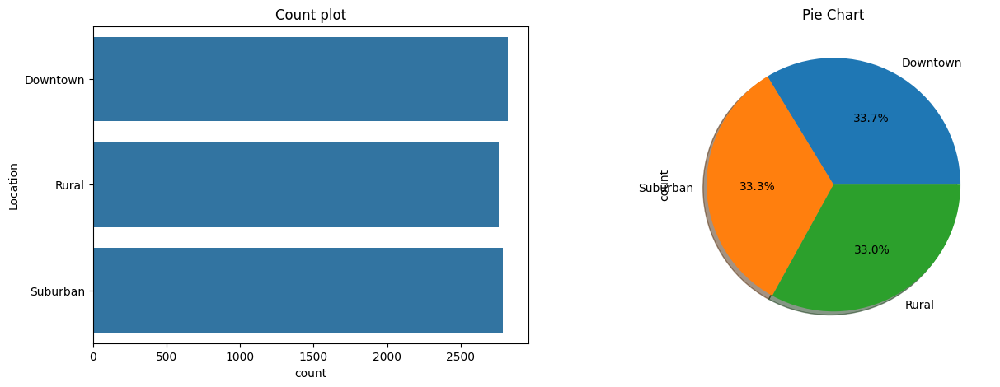

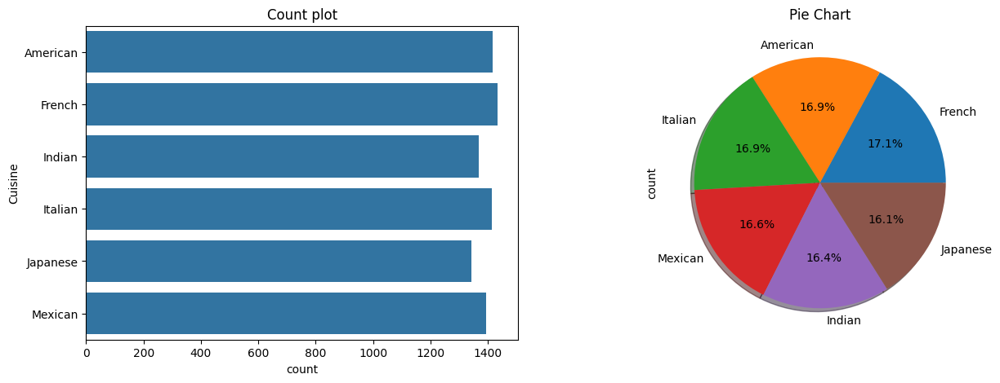

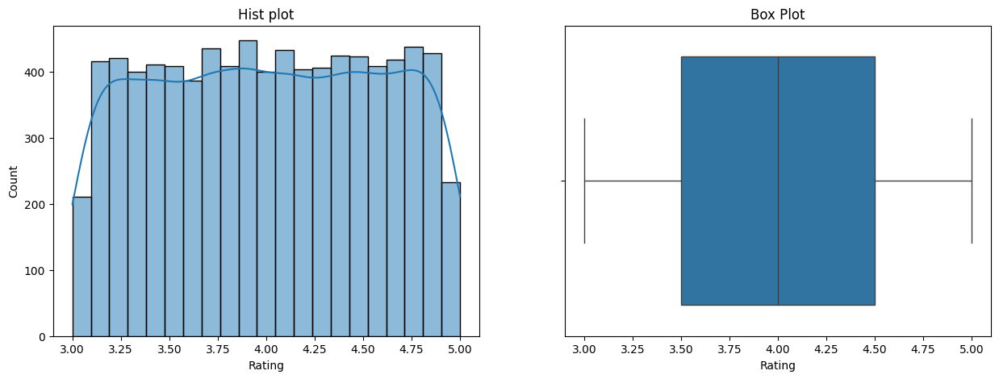

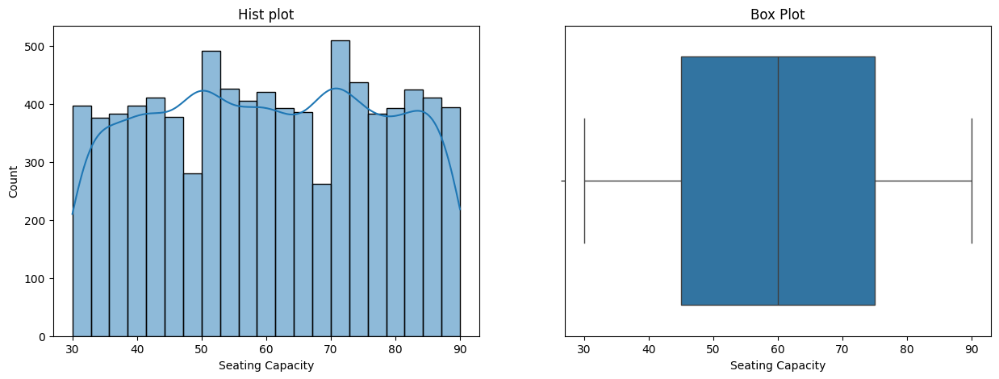

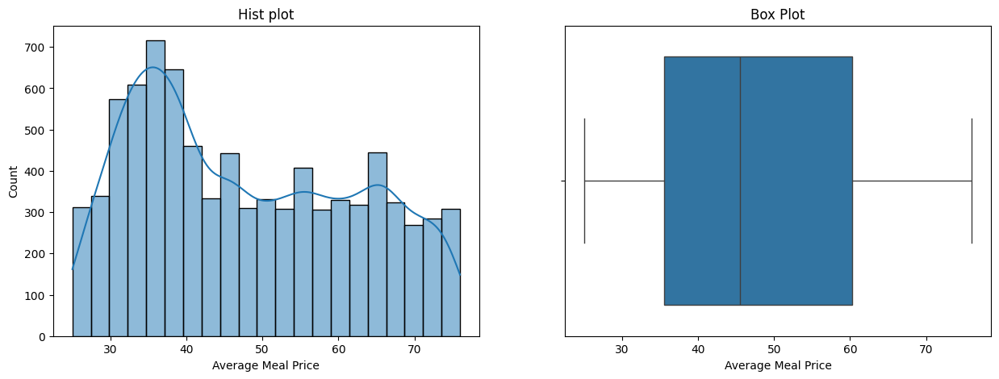

...

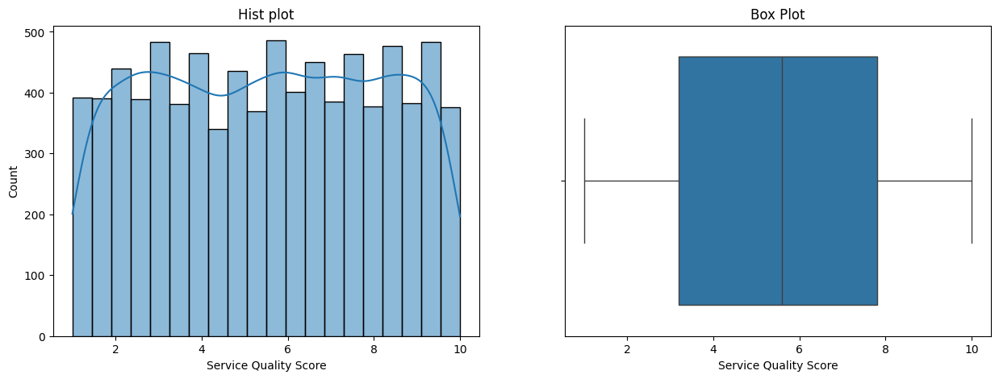

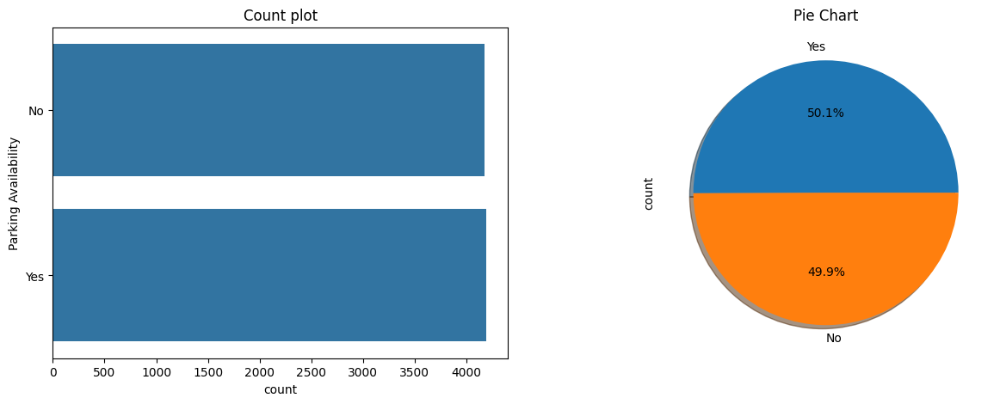

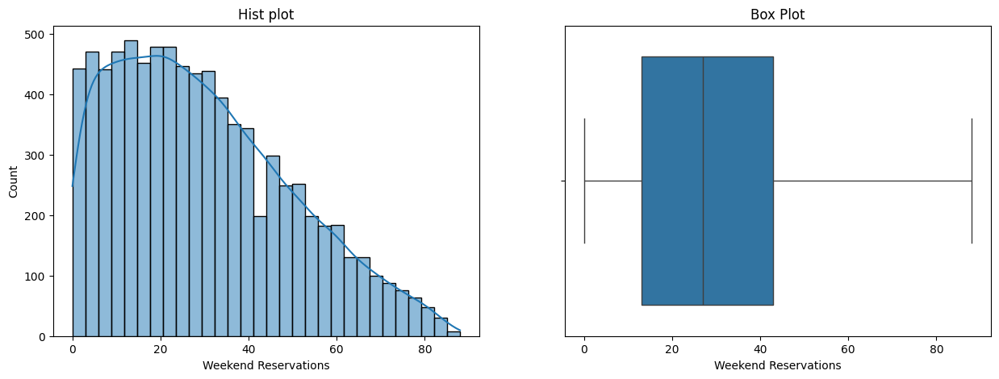

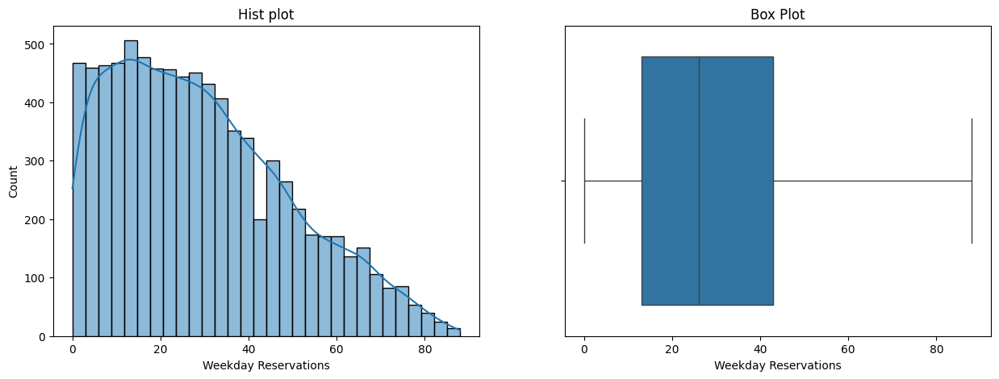

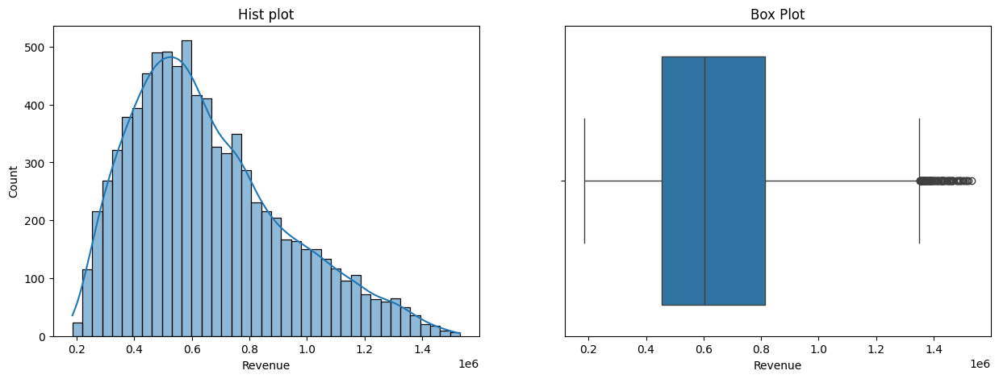

In [16]:
# loop over the all the variables in the data
for i in restaurant_revenue_data.columns.drop('Name'):
    # check if the unique values are >5 or not confirm whether it is Nominal data or ordinal data
    if len(restaurant_revenue_data[i].unique()) > 5 and restaurant_revenue_data[i].dtype != 'object':
        # numerical plot function for ordinal data
        univariate_plot_numerical(restaurant_revenue_data[i])
    else:
        # object plot function for nominal data
        univariate_plot_object(restaurant_revenue_data[i].astype('category'))

In [17]:
def object_with_target_box_plot(data,target):
    fig,ax = plt.subplots(1,1,figsize=(7,4))
    sns.boxplot(x=target,y=data,palette='bright')
    
def numerical_with_target_scatterplot(data,target):
    fig,ax = plt.subplots(1,1,figsize=(7,4))
    sns.scatterplot(x=data,y=target,)

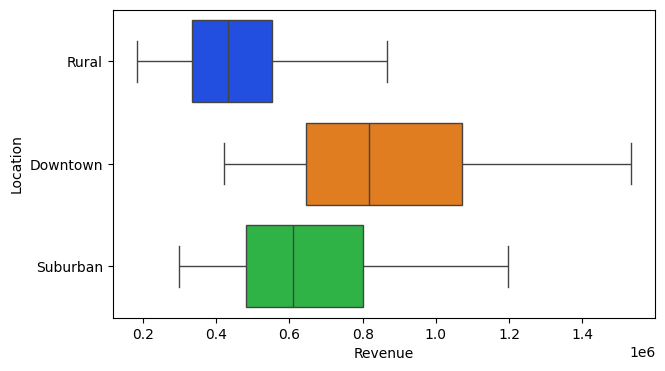

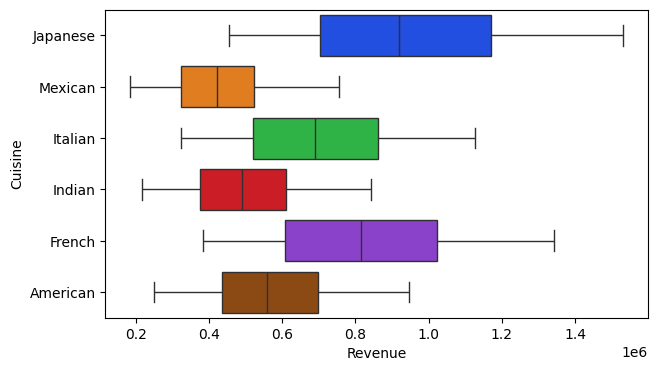

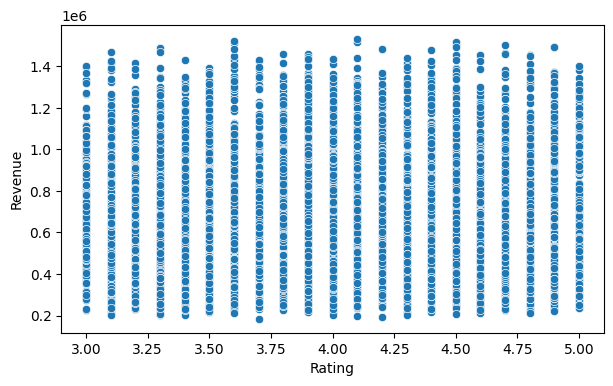

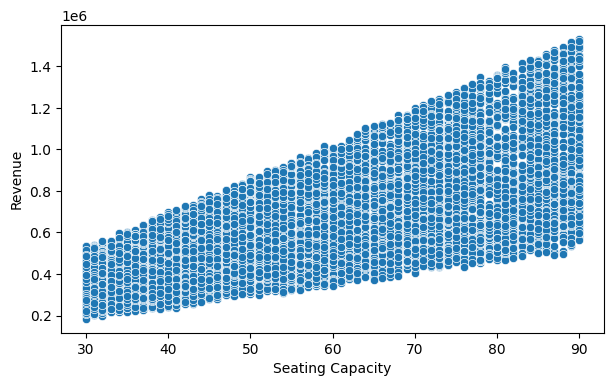

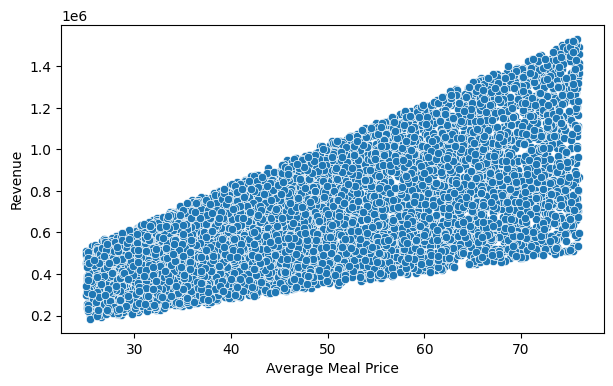

...

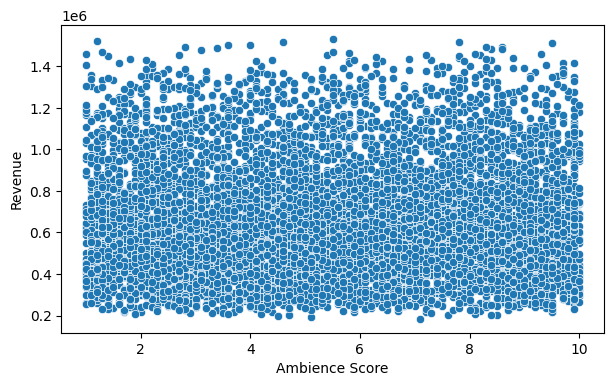

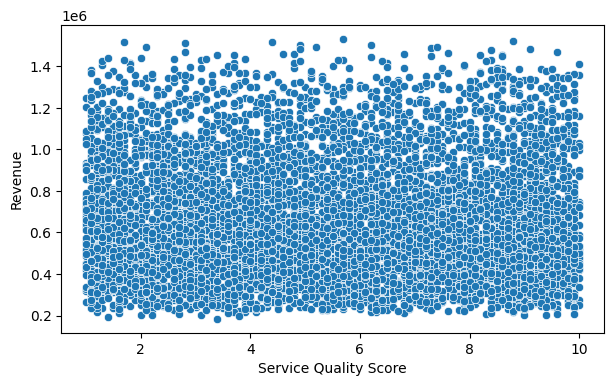

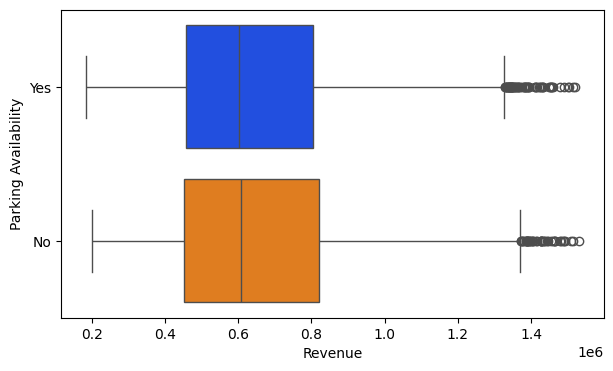

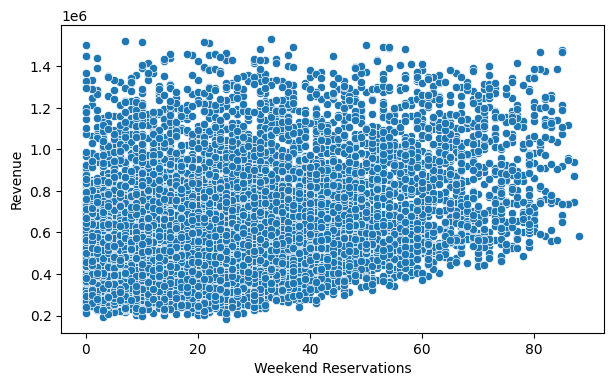

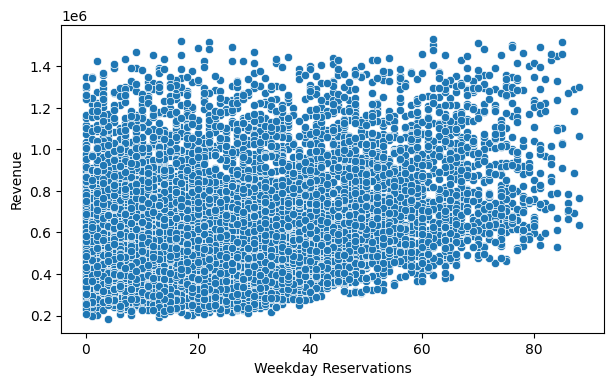

In [18]:
for i in restaurant_revenue_data.columns.drop(['Revenue','Name']):
    if len(restaurant_revenue_data[i].unique()) > 5 and restaurant_revenue_data[i].dtype != 'object':
        numerical_with_target_scatterplot(restaurant_revenue_data[i],restaurant_revenue_data['Revenue'])
    else:
        object_with_target_box_plot(restaurant_revenue_data[i],restaurant_revenue_data['Revenue'])

<Axes: >

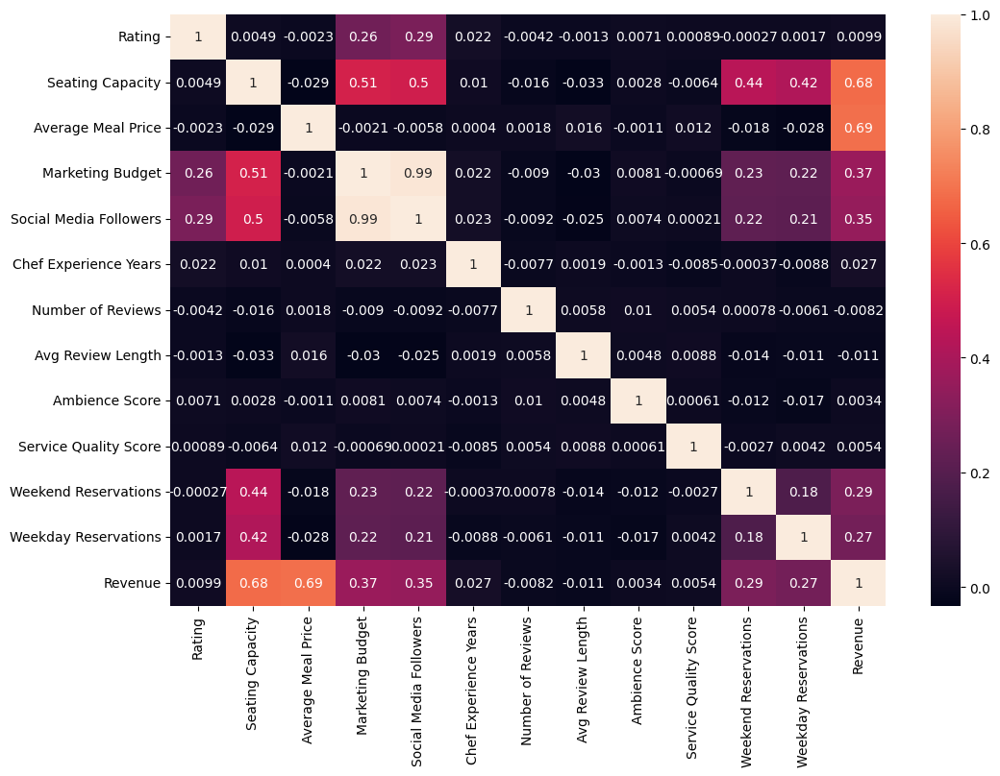

In [19]:
# Correlation with hist plot
plt.figure(figsize=(12,8))
sns.heatmap(restaurant_revenue_data.corr(numeric_only=True),annot=True)

In [20]:
pairplot_data = restaurant_revenue_data.select_dtypes(include=['int','float'])
pairplot_data['Location']  = restaurant_revenue_data['Location']

<Figure size 1000x700 with 0 Axes>

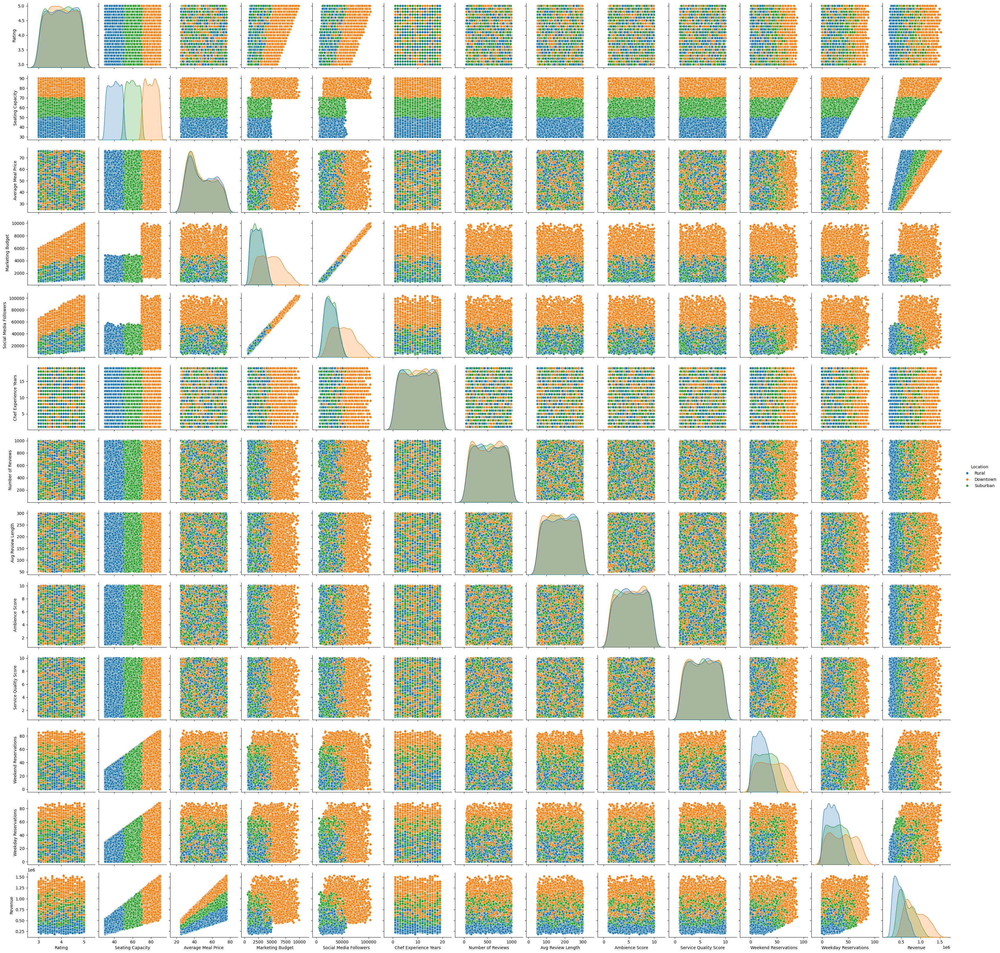

In [21]:
# pair plot for the data
plt.figure(figsize=(10,7))
sns.pairplot(pairplot_data,hue='Location')

__Findings__
1. In our data we have 8000 records and 17 features with revenue as the target variable
2. When we observe univariate plots of the data. our data is from the 3 different locations called Down town, Rular and Sub urban with 6 types of different cuisines.
3. Average rating for the Restuarants is 4.0 and average Revenue was 656 thousand.
4. When we see the difference between the Revenue of different locations we can see that revenue of from the restuarants in Downtown was high when compare to other locations.
5. When observe the revenue in the Cuisines, Japanese and Italian type cuisines getting more revenues. Mexican type cuisines getting low revenues.
6. When Restuarants spending marketing budget greater than 5000 they are getting th ehigh revenues.
7. Most of the Restuarants in the downtown having the seating capacity >60. that is one of the possibility to get good revenues.

## 3. Feature Engineering

In [22]:
# convert the 2 different scores into 1 as overall score
restaurant_revenue_data['Overall Score'] = (restaurant_revenue_data['Ambience Score']+restaurant_revenue_data['Service Quality Score'])/2

In [23]:
# calculating marketing budget per social media follower
restaurant_revenue_data['Marketing Budget/follower'] = restaurant_revenue_data['Marketing Budget']/restaurant_revenue_data['Social Media Followers']

In [24]:
# convert discrete value columns to categorical
lambda_function = lambda x: '>60' if x>60 else '41-60' if x>40 else '21-40' if x>20 else '0-20'
restaurant_revenue_data['Weekday Reservations'] = restaurant_revenue_data['Weekday Reservations'].apply(lambda_function)
restaurant_revenue_data['Weekend Reservations'] = restaurant_revenue_data['Weekend Reservations'].apply(lambda_function)
restaurant_revenue_data['Seating Capacity'] = restaurant_revenue_data['Seating Capacity'].apply(lambda_function)

In [25]:
# convert chef ecp column to categorical values
restaurant_revenue_data['Chef Experience Years'] = restaurant_revenue_data['Chef Experience Years'].apply(lambda x:'>10' if x>10 else '6-10' if x>5 else '0-5')

In [26]:
# convert the revenue into Thousands
restaurant_revenue_data['Revenue in Thousands'] = restaurant_revenue_data['Revenue']/1000

In [27]:
# drop the unuseful columns from the data
restaurant_revenue_data.drop(['Name','Marketing Budget','Social Media Followers','Ambience Score','Service Quality Score','Revenue'],axis=1,inplace=True)

In [28]:
# convert the all object type values to numerical using Label Encoder
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for i in restaurant_revenue_data.select_dtypes(include='object'):
    restaurant_revenue_data[i] = le.fit_transform(restaurant_revenue_data[i])

In [29]:
# separate the dependet and independent features
X = restaurant_revenue_data.drop('Revenue in Thousands',axis=1)
y= restaurant_revenue_data['Revenue in Thousands']

In [30]:
# split the data into train and test
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=7,shuffle=True)

## 4. Model Training and Testing

In [31]:
# import mse and mape metric libraries
from sklearn.metrics import root_mean_squared_error,mean_absolute_percentage_error

In [32]:
# import library for linear regression model
from sklearn.linear_model import LinearRegression

# initialize the linea regression model
linear_regression_model = LinearRegression()
# fit the train data
linear_regression_model.fit(X_train,y_train)
# predidt the values
linear_regression_model_predictions = linear_regression_model.predict(X_test)

# print the metric values
print(f" Root Mean Squared Error for Linear Regression (RMSE): {root_mean_squared_error(linear_regression_model_predictions,y_test)}")
print(f" Mean Absolute Percentage Error for Linear Regression(MAPE): {mean_absolute_percentage_error(linear_regression_model_predictions,y_test)}")

 Root Mean Squared Error for Linear Regression (RMSE): 83.59764289536069
 Mean Absolute Percentage Error for Linear Regression(MAPE): 0.12536311724929103


In [33]:
# import library for Decision tree model
from sklearn.tree import DecisionTreeRegressor

# initialize the model
decision_tree_regression_model = DecisionTreeRegressor(random_state=7)
# fit the train data
decision_tree_regression_model.fit(X_train,y_train)
# make the predictions
decision_tree_regression_model_predictions = decision_tree_regression_model.predict(X_test)

# print the metric values
print(f" Root Mean Squared Error for Decision Tree Regressor Model(RMSE): {root_mean_squared_error(decision_tree_regression_model_predictions,y_test)}")
print(f" Mean Absolute Percentage Error for Decision Tree Regression Model(MAPE): {mean_absolute_percentage_error(decision_tree_regression_model_predictions,y_test)}")

 Root Mean Squared Error for Decision Tree Regressor Model(RMSE): 68.21484513736614
 Mean Absolute Percentage Error for Decision Tree Regression Model(MAPE): 0.07655366225026933


In [34]:
# import lirary for random forest model
from sklearn.ensemble import RandomForestRegressor

# initialize the model
random_forest_regression_model = RandomForestRegressor(random_state=7,n_estimators=50)
# fit the data
random_forest_regression_model.fit(X_train,y_train)
# make the predictions
random_forest_regression_model_predictions = random_forest_regression_model.predict(X_test)

# print the metric values
print(f" Root Mean Squared Error for Randome forest Regresssor (RMSE): {root_mean_squared_error(random_forest_regression_model_predictions,y_test)}")
print(f" Mean Absolute Percentage Error for Random Forest Regressor (MAPE): {mean_absolute_percentage_error(random_forest_regression_model_predictions,y_test)}")

 Root Mean Squared Error for Randome forest Regresssor (RMSE): 49.76349511726989
 Mean Absolute Percentage Error for Random Forest Regressor (MAPE): 0.05866861374081216


__Conclusion__
1. when i trained the Restaturant revenue data with Linear regression model got the RMSE score of 83 and MAPE 12%.
2. when trained with Decision Tree Regressor got the RMSE score of 68 and MAPE 7%.
3. With Random forest Regressor got the RMSE score of 49 and MAPE 5%. which was quite better than the other 2 models.
4. Radom forest Regressor will be the good model for the Restuarant Revenue data. 